In [32]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [33]:
import sys
sys.path.append("/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm")
# torch_utils is needed from this path. 
sys.path.append("/n/home12/binxuwang/Github/mini_edm")
sys.path.append("/n/home12/binxuwang/Github/DiffusionMemorization")

In [3]:
import json
from tqdm import tqdm
import re 
import glob
import os
from os.path import join
import torch
import pickle as pkl
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from generate import edm_sampler
# from core.edm_utils import edm_sampler
# from train_edm import create_model, edm_sampler
from torchvision.utils import make_grid, save_image
from torchvision.transforms import ToPILImage

device = 'cuda'

In [4]:
train_root = "/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs"

In [5]:
!cd /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs ; du -sh *

240M	00004-afhqv2-64x64-uncond-ncsnpp-edm-gpus1-batch64-fp32
1.7G	00013-afhqv2-64x64-uncond-ncsnpp-edm-gpus4-batch768-fp16
237M	00017-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32
237M	00018-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch392-fp32
4.2G	00019-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32
4.2G	00020-ffhq-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32
6.5G	00021-afhqv2-64x64-whitened-nonorm-uncond-ddpmpp-edm-gpus4-batch256-fp32
6.5G	00022-afhqv2-64x64-whitened-uncond-ddpmpp-edm-gpus4-batch256-fp32
6.5G	00023-ffhq-64x64-whitened-uncond-ddpmpp-edm-gpus4-batch256-fp32
6.5G	00024-ffhq-64x64-whitened-nonorm-uncond-ddpmpp-edm-gpus4-batch256-fp32
6.5G	00028-afhqv2-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32
6.5G	00029-ffhq-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32
3.3G	00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32
3.3G	00031-ffhq-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32
12G	00032-cifar10-32x32-uncond-ddpmpp-edm-gpus4-batch256-fp32

In [12]:
ckptdir = "00020-ffhq-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32"
ckptdir = "00019-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32"

In [23]:
import sys
sys.path.append("/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm")
def load_edm_model(ckptdir, ckpt_idx=-1, train_root=train_root, return_epoch=False):
    ckpt_list = glob.glob(join(train_root, ckptdir, "*.pkl"))
    ckpt_list = sorted(ckpt_list)
    ckpt_path = ckpt_list[ckpt_idx]
    epoch = int(re.findall(r'-(\d+).pkl', ckpt_path)[-1])
    print(f"Loading {ckpt_idx}th ckpt", ckpt_path)
    print("Epoch ", epoch)
    with open(ckpt_path, 'rb') as f:
        net = pkl.load(f)['ema'].to(device)
    if return_epoch:
        return net, epoch
    else:
        return net
    


def load_stats(ckptdir, train_root=train_root):
    train_stats = []
    with open(join(train_root, ckptdir, "stats.jsonl")) as f:
        for line in tqdm(f):
            train_stats.append(json.loads(line))
    return pd.DataFrame(train_stats)

### Load Datasets

In [14]:
from training.dataset import ImageFolderDataset

In [15]:
!ls /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/datasets

afhqv2-64x64-eigen.pt		  ffhq-64x64-eigen.pt
afhqv2-64x64-spectral-whiten.pt   ffhq-64x64-spectral-whiten.pt
afhqv2-64x64-whitened-nonorm.zip  ffhq-64x64-whitened-nonorm.zip
afhqv2-64x64-whitened.zip	  ffhq-64x64-whitened.zip
afhqv2-64x64.zip		  ffhq-64x64.zip
cifar10-32x32.zip


In [16]:
dataroot = "/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/datasets"
dataset_afhq = ImageFolderDataset(join(dataroot, "afhqv2-64x64.zip"))

In [17]:
Xtsr = np.stack([sample for sample, _ in dataset_afhq], axis=0) # (N, C, H, W)
Xtsr = torch.from_numpy(Xtsr)
Xtsr_norm = Xtsr / 127.5 - 1 # convention of edm model 
edm_Xmat = Xtsr_norm.view(Xtsr_norm.shape[0], -1)
edm_Xmat = edm_Xmat.to(device)
edm_Xmean = edm_Xmat.mean(dim=0)
edm_Xcov = (edm_Xmat - edm_Xmean).T @ (edm_Xmat - edm_Xmean) / edm_Xmat.shape[0]
eigvals, eigvecs = torch.linalg.eigh(edm_Xcov)
eigvals = eigvals.flip(0)
eigvecs = eigvecs.flip(1)
edm_imgshape = Xtsr.shape[1:]
edm_std_mean = (torch.trace(edm_Xcov) / edm_Xcov.shape[0]).sqrt()

### Clustering structure of AFHQ

In [18]:
from core.analytical_score_lib import mean_isotropic_score, Gaussian_score, delta_GMM_score
from core.analytical_score_lib import explained_var_vec
from core.analytical_score_lib import sample_Xt_batch, sample_Xt_batch
from core.gaussian_mixture_lib import gaussian_mixture_score_batch_sigma_torch, \
    gaussian_mixture_lowrank_score_batch_sigma_torch, compute_cluster

In [19]:
kmeans_batch = 2048
kmeans_random_seed = 42
kmeans_verbose = 0
lambda_EPS = 1E-5
Us_col = {}
mus_col = {}
Lambdas_col = {}
weights_col = {}
for n_clusters in reversed([1, 2, 5, 10, 20,]): #  50, 100, 
    kmeans, eigval_mat, eigvec_mat, freq_vec, center_mat = compute_cluster(edm_Xmat.cpu(), 
                            n_clusters=n_clusters,
                            kmeans_batch=kmeans_batch, 
                            kmeans_random_seed=kmeans_random_seed,
                            kmeans_verbose=kmeans_verbose,
                            lambda_EPS=lambda_EPS)
    Us_col[n_clusters] = eigvec_mat #.to(device)
    mus_col[n_clusters] = center_mat #.to(device)
    Lambdas_col[n_clusters] = eigval_mat #.to(device)
    weights = freq_vec / freq_vec.sum()
    weights_col[n_clusters] = weights #.to(device)
    print(f"n_clusters={n_clusters}, computed.")

/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  31556048.80640143


100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [02:45<00:00,  8.26s/it]


cov PCA completed for each cluster.
n_clusters=20, computed.


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  33712946.7767118


100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [01:38<00:00,  9.81s/it]


cov PCA completed for each cluster.
n_clusters=10, computed.


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  36387242.270318665


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:04<00:00, 12.97s/it]


cov PCA completed for each cluster.
n_clusters=5, computed.


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  40646453.04290734


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:44<00:00, 22.10s/it]


cov PCA completed for each cluster.
n_clusters=2, computed.


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  45597426.595639005


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:37<00:00, 37.55s/it]


cov PCA completed for each cluster.
n_clusters=1, computed.


### Compare model and anlytical scores

In [35]:
!ls /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs

00004-afhqv2-64x64-uncond-ncsnpp-edm-gpus1-batch64-fp32
00013-afhqv2-64x64-uncond-ncsnpp-edm-gpus4-batch768-fp16
00017-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32
00018-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch392-fp32
00019-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32
00020-ffhq-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32
00021-afhqv2-64x64-whitened-nonorm-uncond-ddpmpp-edm-gpus4-batch256-fp32
00022-afhqv2-64x64-whitened-uncond-ddpmpp-edm-gpus4-batch256-fp32
00023-ffhq-64x64-whitened-uncond-ddpmpp-edm-gpus4-batch256-fp32
00024-ffhq-64x64-whitened-nonorm-uncond-ddpmpp-edm-gpus4-batch256-fp32
00028-afhqv2-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32
00029-ffhq-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32
00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32
00031-ffhq-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32
00032-cifar10-32x32-uncond-ddpmpp-edm-gpus4-batch256-fp32
00033-cifar10-32x32-cond-ddpmpp-edm-gpus4-batch256-fp32
00034-afhqv2-64x6

### Early initial run 1

In [39]:
ckptname = "00034-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32"
len(glob.glob(join(train_root, ckptname, "*.pkl")))
edm = load_edm_model(ckptname, ckpt_idx=-1,)
edm.to(device).eval();

Loading -1th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00034-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-005000.pkl
Epoch  5000


In [ ]:
ckptname = "00034-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32"
device = "cuda"
ckpt_num = len(glob.glob(join(train_root, ckptname, "*.pkl")))
print("Explaining EDM score with GMM and other analytical scores")
df_col = []
for ckpt_idx in tqdm(range(ckpt_num)):
    edm, epoch = load_edm_model(ckptname, ckpt_idx=ckpt_idx, return_epoch=True)
    edm.to(device).eval();
    print(f"ckpt_idx={ckpt_idx}, epoch={epoch}")
    for sigma in [0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 0.75, 1.0, 1.5, 2.0, 5.0, 10.0, 20.0, 30.0, 40.0, 80.0]:
        Xt = sample_Xt_batch(edm_Xmat, 256, sigma=sigma)
        edm_Dt = edm(Xt.view(-1, *edm_imgshape), torch.tensor(sigma).cuda(), None, ).detach()
        edm_Dt = edm_Dt.view(Xt.shape)
        score_edm = (edm_Dt - Xt) / (sigma**2)
        score_K_gmm_Xt = {}
        for n_clusters in [*mus_col.keys()]:
            score_K_gmm_Xt[n_clusters] = gaussian_mixture_score_batch_sigma_torch(Xt, 
                mus_col[n_clusters].cuda(), Us_col[n_clusters].cuda(), Lambdas_col[n_clusters].cuda() + sigma**2, 
                weights=weights_col[n_clusters].cuda(), ).cpu()
        torch.cuda.empty_cache()
        score_mean_Xt = mean_isotropic_score(Xt, edm_Xmean, sigma).cpu()
        score_mean_std_Xt = mean_isotropic_score(Xt, edm_Xmean, sigma, sigma0=edm_std_mean).cpu()
        score_gaussian_Xt = Gaussian_score(Xt, edm_Xmean, edm_Xcov, sigma).cpu()
        score_gaussian_reg_Xt = Gaussian_score(Xt, edm_Xmean, edm_Xcov + torch.eye(edm_Xcov.shape[0]).to(device) * 1E-4, sigma).cpu()
        score_gmm_Xt = delta_GMM_score(Xt, edm_Xmat, sigma).cpu()
        Dt_gmm = score_gmm_Xt * (sigma**2) + Xt.cpu()
        print(f"sigma={sigma}")
        df_col_part = []
        for name, score in [("EDM", score_edm), 
                        ("mean isotropic", score_mean_Xt), 
                        ("mean + std isotropic", score_mean_std_Xt), 
                        ("gaussian", score_gaussian_Xt), 
                        ("gaussian regularize", score_gaussian_reg_Xt),
                        *[(f"gmm_{n_clusters}_mode", score_K_gmm_Xt[n_clusters]) 
                          for n_clusters in sorted([*mus_col.keys()])],
                        ("gmm delta", score_gmm_Xt),
                        ]:
            score = score.to(device)
            Dnoiser = score * (sigma**2) + Xt
            exp_var_vec = explained_var_vec(score_edm, score)
            exp_var_rev_vec = explained_var_vec(score, score_edm)
            exp_var_vec_Dt = explained_var_vec(edm_Dt, Dnoiser)
            exp_var_rev_vec_Dt = explained_var_vec(Dnoiser, edm_Dt)
            St_var_vec = score.pow(2).sum(dim=1)
            Dt_var_vec = Dnoiser.pow(2).sum(dim=1)
            df_col_part.append({"epoch": epoch, "sigma": sigma, "name": name, 
                        "St_EV": exp_var_vec.mean().item(), 
                        "St_EV_std": exp_var_vec.std().item(),
                        "St_EV_rev": exp_var_rev_vec.mean().item(), 
                        "St_EV_rev_std": exp_var_rev_vec.std().item(),
                        "Dt_EV": exp_var_vec_Dt.mean().item(), 
                        "Dt_EV_std": exp_var_vec_Dt.std().item(),
                        "Dt_EV_rev": exp_var_rev_vec_Dt.mean().item(),
                        "Dt_EV_rev_std": exp_var_rev_vec_Dt.std().item(),
                        "St_Var": St_var_vec.mean().item(),
                        "St_Var_std": St_var_vec.std().item(),
                        "Dt_Var": Dt_var_vec.mean().item(), 
                        "Dt_Var_std": Dt_var_vec.std().item(),})
        df_col.extend(df_col_part)
        torch.cuda.empty_cache()
df_syn = pd.DataFrame(df_col)
df_syn["St_residual"] = 1 - df_syn["St_EV"]
df_syn["St_rev_residual"] = 1 - df_syn["St_EV_rev"]
df_syn["Dt_residual"] = 1 - df_syn["Dt_EV"]
df_syn["Dt_rev_residual"] = 1 - df_syn["Dt_EV_rev"]
df_syn.to_csv("AFHQ_edm_5k_epoch_gmm_exp_var.csv")
df_syn.to_csv(join(train_root, ckptdir, "AFHQ_edm_5k_epoch_gmm_exp_var.csv"))

### Early initial run 1

In [31]:
ckptname = "00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32"
device = "cuda"
ckpt_num = len(glob.glob(join(train_root, ckptname, "*.pkl")))
print("Explaining EDM score with GMM and other analytical scores")
df_col = []
for ckpt_idx in tqdm(range(ckpt_num)):
    edm, epoch = load_edm_model(ckptname, ckpt_idx=ckpt_idx, return_epoch=True)
    edm.to(device).eval();
    print(f"ckpt_idx={ckpt_idx}, epoch={epoch}")
    for sigma in [0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 0.75, 1.0, 1.5, 2.0, 5.0, 10.0, 20.0, 30.0, 40.0, 80.0]:
        Xt = sample_Xt_batch(edm_Xmat, 256, sigma=sigma)
        edm_Dt = edm(Xt.view(-1, *edm_imgshape), torch.tensor(sigma).cuda(), None, ).detach()
        edm_Dt = edm_Dt.view(Xt.shape)
        score_edm = (edm_Dt - Xt) / (sigma**2)
        score_K_gmm_Xt = {}
        for n_clusters in [*mus_col.keys()]:
            score_K_gmm_Xt[n_clusters] = gaussian_mixture_score_batch_sigma_torch(Xt, 
                mus_col[n_clusters].cuda(), Us_col[n_clusters].cuda(), Lambdas_col[n_clusters].cuda() + sigma**2, 
                weights=weights_col[n_clusters].cuda(), ).cpu()
        torch.cuda.empty_cache()
        score_mean_Xt = mean_isotropic_score(Xt, edm_Xmean, sigma).cpu()
        score_mean_std_Xt = mean_isotropic_score(Xt, edm_Xmean, sigma, sigma0=edm_std_mean).cpu()
        score_gaussian_Xt = Gaussian_score(Xt, edm_Xmean, edm_Xcov, sigma).cpu()
        score_gaussian_reg_Xt = Gaussian_score(Xt, edm_Xmean, edm_Xcov + torch.eye(edm_Xcov.shape[0]).to(device) * 1E-4, sigma).cpu()
        score_gmm_Xt = delta_GMM_score(Xt, edm_Xmat, sigma).cpu()
        Dt_gmm = score_gmm_Xt * (sigma**2) + Xt.cpu()
        print(f"sigma={sigma}")
        df_col_part = []
        for name, score in [("EDM", score_edm), 
                        ("mean isotropic", score_mean_Xt), 
                        ("mean + std isotropic", score_mean_std_Xt), 
                        ("gaussian", score_gaussian_Xt), 
                        ("gaussian regularize", score_gaussian_reg_Xt),
                        *[(f"gmm_{n_clusters}_mode", score_K_gmm_Xt[n_clusters]) 
                          for n_clusters in sorted([*mus_col.keys()])],
                        ("gmm delta", score_gmm_Xt),
                        ]:
            score = score.to(device)
            Dnoiser = score * (sigma**2) + Xt
            exp_var_vec = explained_var_vec(score_edm, score)
            exp_var_rev_vec = explained_var_vec(score, score_edm)
            exp_var_vec_Dt = explained_var_vec(edm_Dt, Dnoiser)
            exp_var_rev_vec_Dt = explained_var_vec(Dnoiser, edm_Dt)
            St_var_vec = score.pow(2).sum(dim=1)
            Dt_var_vec = Dnoiser.pow(2).sum(dim=1)
            df_col_part.append({"epoch": epoch, "sigma": sigma, "name": name, 
                        "St_EV": exp_var_vec.mean().item(), 
                        "St_EV_std": exp_var_vec.std().item(),
                        "St_EV_rev": exp_var_rev_vec.mean().item(), 
                        "St_EV_rev_std": exp_var_rev_vec.std().item(),
                        "Dt_EV": exp_var_vec_Dt.mean().item(), 
                        "Dt_EV_std": exp_var_vec_Dt.std().item(),
                        "Dt_EV_rev": exp_var_rev_vec_Dt.mean().item(),
                        "Dt_EV_rev_std": exp_var_rev_vec_Dt.std().item(),
                        "St_Var": St_var_vec.mean().item(),
                        "St_Var_std": St_var_vec.std().item(),
                        "Dt_Var": Dt_var_vec.mean().item(), 
                        "Dt_Var_std": Dt_var_vec.std().item(),})
        df_col.extend(df_col_part)
        torch.cuda.empty_cache()
df_syn = pd.DataFrame(df_col)
df_syn["St_residual"] = 1 - df_syn["St_EV"]
df_syn["St_rev_residual"] = 1 - df_syn["St_EV_rev"]
df_syn["Dt_residual"] = 1 - df_syn["Dt_EV"]
df_syn["Dt_rev_residual"] = 1 - df_syn["Dt_EV_rev"]
df_syn.to_csv("AFHQ_edm_1k_epoch_gmm_exp_var.csv")
df_syn.to_csv(join(train_root, ckptdir, "AFHQ_edm_25k_epoch_gmm_exp_var.csv"))

Explaining EDM score with GMM and other analytical scores


  0%|                                                                                                            | 0/11 [00:00<?, ?it/s]

Loading 0th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-000000.pkl
Epoch  0
ckpt_idx=0, epoch=0
sigma=0.01
sigma=0.02
sigma=0.05
sigma=0.1
sigma=0.2
sigma=0.5
sigma=0.75
sigma=1.0
sigma=1.5
sigma=2.0
sigma=5.0
sigma=10.0
sigma=20.0
sigma=30.0
sigma=40.0


  9%|█████████                                                                                          | 1/11 [02:03<20:34, 123.42s/it]

sigma=80.0
Loading 1th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-000100.pkl
Epoch  100
ckpt_idx=1, epoch=100
sigma=0.01
sigma=0.02
sigma=0.05
sigma=0.1
sigma=0.2
sigma=0.5
sigma=0.75
sigma=1.0
sigma=1.5
sigma=2.0
sigma=5.0
sigma=10.0
sigma=20.0
sigma=30.0
sigma=40.0


 18%|██████████████████                                                                                 | 2/11 [04:07<18:34, 123.86s/it]

sigma=80.0
Loading 2th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-000200.pkl
Epoch  200
ckpt_idx=2, epoch=200
sigma=0.01
sigma=0.02
sigma=0.05
sigma=0.1
sigma=0.2
sigma=0.5
sigma=0.75
sigma=1.0
sigma=1.5
sigma=2.0
sigma=5.0
sigma=10.0
sigma=20.0
sigma=30.0
sigma=40.0


 27%|██████████████████████████▉                                                                        | 3/11 [06:12<16:34, 124.26s/it]

sigma=80.0
Loading 3th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-000301.pkl
Epoch  301
ckpt_idx=3, epoch=301
sigma=0.01
sigma=0.02
sigma=0.05
sigma=0.1
sigma=0.2
sigma=0.5
sigma=0.75
sigma=1.0
sigma=1.5
sigma=2.0
sigma=5.0
sigma=10.0
sigma=20.0
sigma=30.0
sigma=40.0


 36%|████████████████████████████████████                                                               | 4/11 [08:16<14:30, 124.33s/it]

sigma=80.0
Loading 4th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-000401.pkl
Epoch  401
ckpt_idx=4, epoch=401
sigma=0.01
sigma=0.02
sigma=0.05
sigma=0.1
sigma=0.2
sigma=0.5
sigma=0.75
sigma=1.0
sigma=1.5
sigma=2.0
sigma=5.0
sigma=10.0
sigma=20.0
sigma=30.0
sigma=40.0


 45%|█████████████████████████████████████████████                                                      | 5/11 [10:21<12:25, 124.31s/it]

sigma=80.0
Loading 5th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-000502.pkl
Epoch  502
ckpt_idx=5, epoch=502
sigma=0.01
sigma=0.02
sigma=0.05
sigma=0.1
sigma=0.2
sigma=0.5
sigma=0.75
sigma=1.0
sigma=1.5
sigma=2.0
sigma=5.0
sigma=10.0
sigma=20.0
sigma=30.0
sigma=40.0


 55%|█████████████████████████████████████████████████████▉                                             | 6/11 [12:25<10:20, 124.19s/it]

sigma=80.0
Loading 6th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-000602.pkl
Epoch  602
ckpt_idx=6, epoch=602
sigma=0.01
sigma=0.02
sigma=0.05
sigma=0.1
sigma=0.2
sigma=0.5
sigma=0.75
sigma=1.0
sigma=1.5
sigma=2.0
sigma=5.0
sigma=10.0
sigma=20.0
sigma=30.0
sigma=40.0


 64%|███████████████████████████████████████████████████████████████                                    | 7/11 [14:28<08:15, 123.83s/it]

sigma=80.0
Loading 7th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-000702.pkl
Epoch  702
ckpt_idx=7, epoch=702
sigma=0.01
sigma=0.02
sigma=0.05
sigma=0.1
sigma=0.2
sigma=0.5
sigma=0.75
sigma=1.0
sigma=1.5
sigma=2.0
sigma=5.0
sigma=10.0
sigma=20.0
sigma=30.0
sigma=40.0


 73%|████████████████████████████████████████████████████████████████████████                           | 8/11 [16:31<06:11, 123.80s/it]

sigma=80.0
Loading 8th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-000803.pkl
Epoch  803
ckpt_idx=8, epoch=803
sigma=0.01
sigma=0.02
sigma=0.05
sigma=0.1
sigma=0.2
sigma=0.5
sigma=0.75
sigma=1.0
sigma=1.5
sigma=2.0
sigma=5.0
sigma=10.0
sigma=20.0
sigma=30.0
sigma=40.0


 82%|█████████████████████████████████████████████████████████████████████████████████                  | 9/11 [18:35<04:07, 123.64s/it]

sigma=80.0
Loading 9th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-000903.pkl
Epoch  903
ckpt_idx=9, epoch=903
sigma=0.01
sigma=0.02
sigma=0.05
sigma=0.1
sigma=0.2
sigma=0.5
sigma=0.75
sigma=1.0
sigma=1.5
sigma=2.0
sigma=5.0
sigma=10.0
sigma=20.0
sigma=30.0
sigma=40.0


 91%|█████████████████████████████████████████████████████████████████████████████████████████         | 10/11 [20:40<02:04, 124.05s/it]

sigma=80.0
Loading 10th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-001000.pkl
Epoch  1000
ckpt_idx=10, epoch=1000
sigma=0.01
sigma=0.02
sigma=0.05
sigma=0.1
sigma=0.2
sigma=0.5
sigma=0.75
sigma=1.0
sigma=1.5
sigma=2.0
sigma=5.0
sigma=10.0
sigma=20.0
sigma=30.0
sigma=40.0


100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [22:43<00:00, 123.96s/it]

sigma=80.0


In [22]:
# ckptdir = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/mini_edm/exps/base_mnist_20240130-2207/checkpoints/"
# epoch = 2500 # 49999
# config = get_default_config("mnist")
# edm, _ = create_edm(join(ckptdir, f"ema_{epoch}.pth"), config,)
device = "cuda"
print("Explaining EDM score with GMM and other analytical scores")
df_col = []
for sigma in [0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 0.75, 1.0, 1.5, 2.0, 5.0, 10.0, 20.0]:
    Xt = sample_Xt_batch(edm_Xmat, 256, sigma=sigma)
    with torch.no_grad():
        edm_Dt = edm(Xt.view(-1, *edm_imgshape), torch.tensor(sigma).cuda(), None, ).detach() # use_ema=False
    edm_Dt = edm_Dt.view(Xt.shape)
    score_edm = (edm_Dt - Xt) / (sigma**2)
    score_K_gmm_Xt = {}
    for n_clusters in [*mus_col.keys()]:
        score_K_gmm_Xt[n_clusters] = gaussian_mixture_score_batch_sigma_torch(Xt, 
            mus_col[n_clusters].cuda(), Us_col[n_clusters].cuda(), Lambdas_col[n_clusters].cuda() + sigma**2, 
            weights=weights_col[n_clusters].cuda(), )
    score_mean_Xt = mean_isotropic_score(Xt, edm_Xmean, sigma)
    score_mean_std_Xt = mean_isotropic_score(Xt, edm_Xmean, sigma, sigma0=edm_std_mean)
    score_gaussian_Xt = Gaussian_score(Xt, edm_Xmean, edm_Xcov, sigma)
    score_gaussian_reg_Xt = Gaussian_score(Xt, edm_Xmean, edm_Xcov + torch.eye(edm_Xcov.shape[0]).to(device) * 1E-4, sigma)
    score_gmm_Xt = delta_GMM_score(Xt, edm_Xmat, sigma)
    print(f"sigma={sigma}")
    df_col_part = []
    Dt_gmm = score_gmm_Xt * (sigma**2) + Xt
    for name, score in [("EDM", score_edm), 
                        ("mean isotropic", score_mean_Xt), 
                        ("mean + std isotropic", score_mean_std_Xt), 
                        ("gaussian", score_gaussian_Xt), 
                        ("gaussian regularize", score_gaussian_reg_Xt),
                        *[(f"gmm_{n_clusters}_mode", score_K_gmm_Xt[n_clusters]) 
                          for n_clusters in score_K_gmm_Xt],
                        ("gmm delta", score_gmm_Xt),
                        ]:
        Dnoiser = score * (sigma**2) + Xt
        exp_var_vec = explained_var_vec(score_edm, score)
        exp_var_rev_vec = explained_var_vec(score, score_edm)
        exp_var_vec_Dt = explained_var_vec(edm_Dt, Dnoiser)
        exp_var_rev_vec_Dt = explained_var_vec(Dnoiser, edm_Dt)
        df_col_part.append({"sigma": sigma, "name": name, 
                       "St_EV": exp_var_vec.mean().item(), 
                       "St_EV_rev": exp_var_rev_vec.mean().item(), 
                       "Dt_EV": exp_var_vec_Dt.mean().item(), 
                       "Dt_EV_rev": exp_var_rev_vec_Dt.mean().item()})
    torch.cuda.empty_cache()
    df_col.extend(df_col_part)
    print(pd.DataFrame(df_col_part))

Explaining EDM score with GMM and other analytical scores
sigma=0.01
   sigma                  name          St_EV  St_EV_rev     Dt_EV  Dt_EV_rev
0   0.01                   EDM       1.000000   1.000000  1.000000   1.000000
1   0.01        mean isotropic -511481.750000  -0.001683  0.069462 -12.165503
2   0.01  mean + std isotropic      -0.438660 -16.035141  0.999997   0.999997
3   0.01              gaussian     -68.188721  -0.015213  0.999869   0.999869
4   0.01   gaussian regularize     -26.819939  -0.040094  0.999947   0.999947
5   0.01             gmm delta    -247.231140  -0.004037  0.999529   0.999528
sigma=0.02
   sigma                  name          St_EV  St_EV_rev     Dt_EV  Dt_EV_rev
0   0.02                   EDM       1.000000   1.000000  1.000000   1.000000
1   0.02        mean isotropic -161474.718750  -0.002543  0.062605 -12.467638
2   0.02  mean + std isotropic      -1.120086  -4.024801  0.999987   0.999986
3   0.02              gaussian    -121.781143  -0.002324  0.99

21it [00:00, 30626.00it/s]


<Axes: >

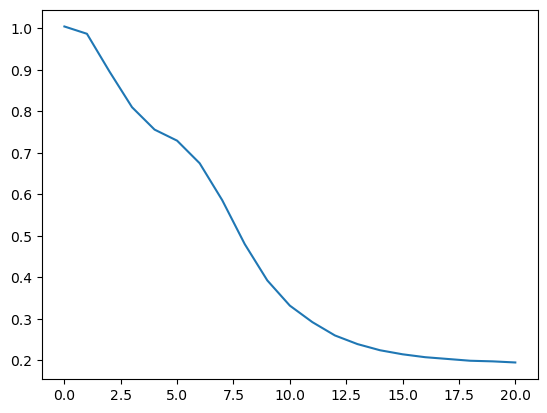

In [31]:
ckptdir = "00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32"
train_stats = load_stats(ckptdir)
train_stats["Loss/loss"].map(lambda x: x["mean"]).plot()

Loading 1th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00030-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-000100.pkl
Epoch  100


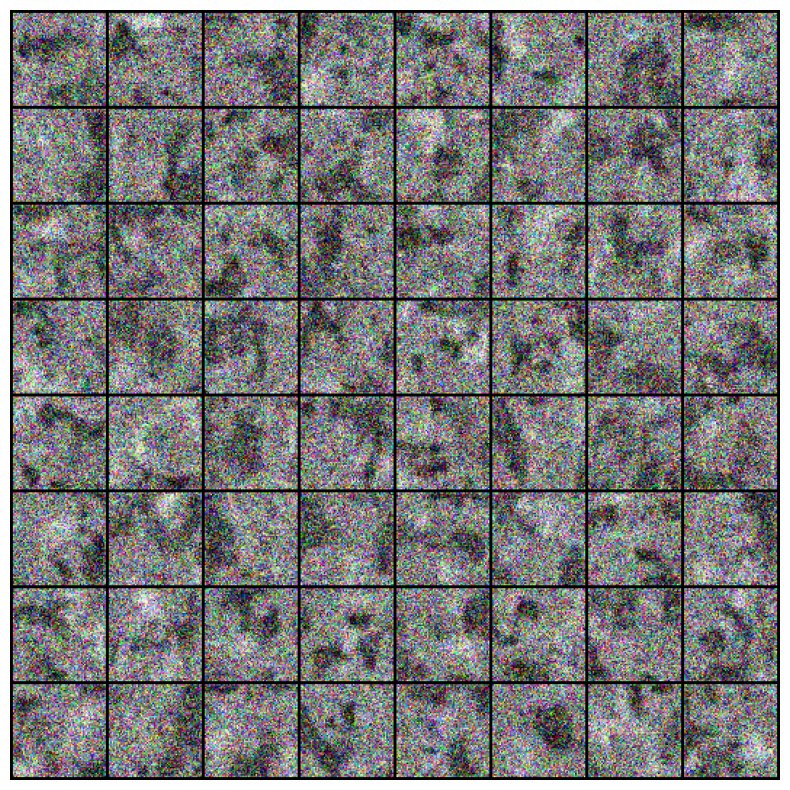

In [43]:
net = load_edm_model(ckptdir, ckpt_idx=1,)
# Create a grid of images
batch_size = 64
latents = torch.randn([batch_size, net.img_channels, net.img_resolution, net.img_resolution], 
                    device=device)
samples = edm_sampler(net, latents, num_steps=35, )
# samples = (samples.clamp(-1, 1) + 1) / 2
samples = (samples * 127.5 + 128).clip(0, 255) / 255.0
grid = make_grid(samples.cpu(), nrow=8, normalize=True)
# Plot the grid
plt.figure(figsize=(10, 10))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')
plt.show()

In [92]:
!ls /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00019-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32

log.txt			     network-snapshot-022579.pkl
network-snapshot-000000.pkl  network-snapshot-025088.pkl
network-snapshot-002509.pkl  network-snapshot-027597.pkl
network-snapshot-005017.pkl  network-snapshot-030105.pkl
network-snapshot-007526.pkl  network-snapshot-032614.pkl
network-snapshot-010035.pkl  network-snapshot-035123.pkl
network-snapshot-012544.pkl  stats.jsonl
network-snapshot-015053.pkl  training_options.json
network-snapshot-017561.pkl  training-state-025088.pt
network-snapshot-020070.pkl


707it [00:00, 70211.27it/s]

<Axes: >

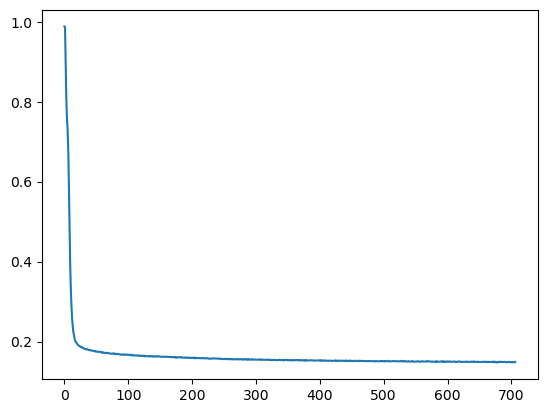

In [23]:
ckptdir = "00019-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32"
train_stats = load_stats(ckptdir)
train_stats["Loss/loss"].map(lambda x: x["mean"]).plot()

## Original Pixel Models 

In [37]:
ckptdir = "00020-ffhq-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32"
ckptdir = "00019-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32"
net = load_edm_model(ckptdir, ckpt_idx=-1,)

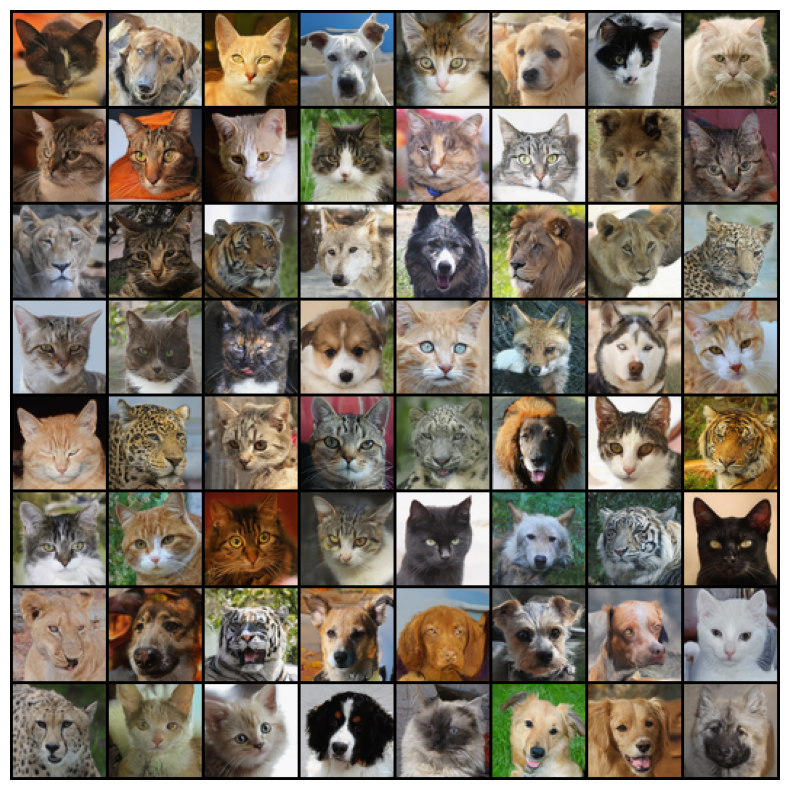

In [36]:
# Create a grid of images
batch_size = 64
latents = torch.randn([batch_size, net.img_channels, net.img_resolution, net.img_resolution], 
                    device=device)
samples = edm_sampler(net, latents, num_steps=35, )

grid = make_grid(samples.cpu(), nrow=8, normalize=True)
# Plot the grid
plt.figure(figsize=(10, 10))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')
plt.show()

In [70]:
ckptdir = "00020-ffhq-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32"
ckptdir = "00019-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32"
net = load_edm_model(ckptdir, ckpt_idx=1,)

Loading  /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00019-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-002509.pkl
Epoch  2509


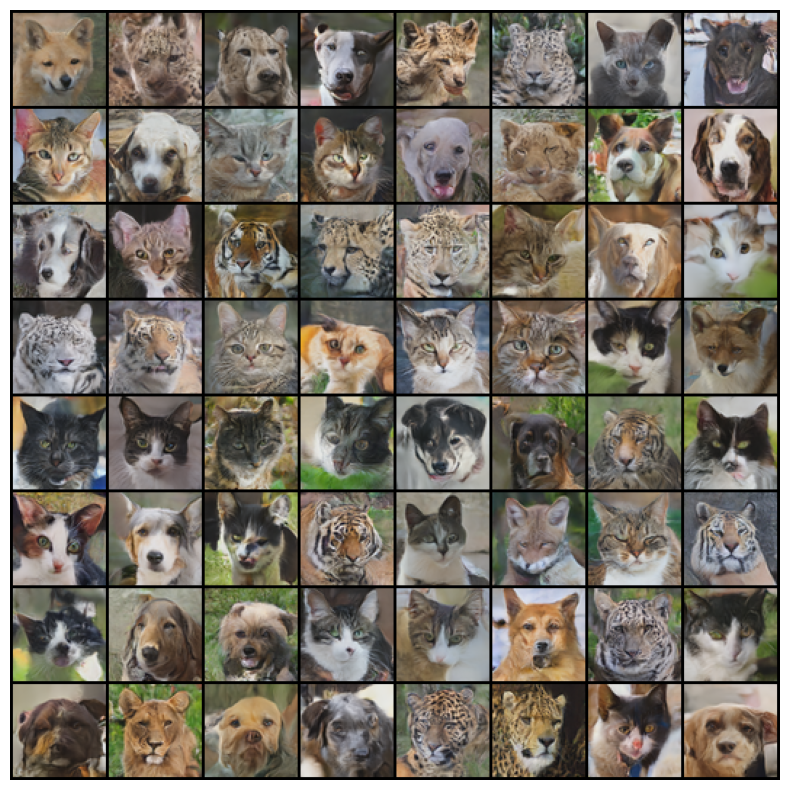

In [72]:
# Create a grid of images
batch_size = 64
latents = torch.randn([batch_size, net.img_channels, net.img_resolution, net.img_resolution], 
                    device=device, generator=torch.cuda.manual_seed(42))
samples = edm_sampler(net, latents, num_steps=35, )

grid = make_grid(samples.cpu(), nrow=8, normalize=True)
# Plot the grid
plt.figure(figsize=(10, 10))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')
plt.show()

## Spectral Whiten Models 

In [26]:
sorted(os.listdir(train_root))

['00004-afhqv2-64x64-uncond-ncsnpp-edm-gpus1-batch64-fp32',
 '00008-afhqv2-64x64-uncond-ncsnpp-edm-gpus4-batch4-fp32',
 '00011-afhqv2-64x64-uncond-ncsnpp-edm-gpus4-batch8-fp16',
 '00012-afhqv2-64x64-uncond-ncsnpp-edm-gpus4-batch256-fp16',
 '00013-afhqv2-64x64-uncond-ncsnpp-edm-gpus4-batch768-fp16',
 '00017-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32',
 '00018-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch392-fp32',
 '00019-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32',
 '00020-ffhq-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32',
 '00021-afhqv2-64x64-whitened-nonorm-uncond-ddpmpp-edm-gpus4-batch256-fp32',
 '00022-afhqv2-64x64-whitened-uncond-ddpmpp-edm-gpus4-batch256-fp32',
 '00023-ffhq-64x64-whitened-uncond-ddpmpp-edm-gpus4-batch256-fp32',
 '00024-ffhq-64x64-whitened-nonorm-uncond-ddpmpp-edm-gpus4-batch256-fp32',
 '00028-afhqv2-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32',
 '00029-ffhq-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32']

In [27]:
train_stats

,Loss/loss,Progress/tick,Progress/kimg,Timing/total_sec,Timing/sec_per_tick,Timing/sec_per_kimg,Timing/maintenance_sec,Resources/cpu_mem_gb,Resources/peak_gpu_mem_gb,Resources/peak_gpu_mem_reserved_gb,timestamp
0,"{'num': 3145728, 'mean': 1.6964410940806072, '...","{'num': 1, 'mean': 0.0, 'std': 0.0}","{'num': 1, 'mean': 0.25600001215934753, 'std':...","{'num': 1, 'mean': 29.674842834472656, 'std': ...","{'num': 1, 'mean': 14.194101333618164, 'std': ...","{'num': 1, 'mean': 55.445709228515625, 'std': ...","{'num': 1, 'mean': 15.480741500854492, 'std': ...","{'num': 1, 'mean': 2.1108779907226562, 'std': ...","{'num': 1, 'mean': 24.855844497680664, 'std': ...","{'num': 1, 'mean': 27.0546875, 'std': 0.0}",1.695365e+09
1,"{'num': 616562688, 'mean': 1.692470090324376, ...","{'num': 1, 'mean': 1.0, 'std': 0.0}","{'num': 1, 'mean': 50.43199920654297, 'std': 0.0}","{'num': 1, 'mean': 154.5857696533203, 'std': 0.0}","{'num': 1, 'mean': 122.12417602539062, 'std': ...","{'num': 1, 'mean': 2.4339160919189453, 'std': ...","{'num': 1, 'mean': 2.7867560386657715, 'std': ...","{'num': 1, 'mean': 2.5816574096679688, 'std': ...","{'num': 1, 'mean': 20.68939971923828, 'std': 0.0}","{'num': 1, 'mean': 22.392578125, 'std': 0.0}",1.695365e+09
2,"{'num': 616562688, 'mean': 1.6705487498215266,...","{'num': 1, 'mean': 2.0, 'std': 0.0}","{'num': 1, 'mean': 100.60800170898438, 'std': ...","{'num': 1, 'mean': 276.7005310058594, 'std': 0.0}","{'num': 1, 'mean': 122.10417175292969, 'std': ...","{'num': 1, 'mean': 2.4335174560546875, 'std': ...","{'num': 1, 'mean': 0.010591983795166016, 'std'...","{'num': 1, 'mean': 2.5816574096679688, 'std': ...","{'num': 1, 'mean': 20.689455032348633, 'std': ...","{'num': 1, 'mean': 22.392578125, 'std': 0.0}",1.695365e+09
3,"{'num': 616562688, 'mean': 1.616183834011052, ...","{'num': 1, 'mean': 3.0, 'std': 0.0}","{'num': 1, 'mean': 150.78399658203125, 'std': ...","{'num': 1, 'mean': 398.8290710449219, 'std': 0.0}","{'num': 1, 'mean': 122.1179428100586, 'std': 0.0}","{'num': 1, 'mean': 2.4337918758392334, 'std': ...","{'num': 1, 'mean': 0.010590076446533203, 'std'...","{'num': 1, 'mean': 2.5816574096679688, 'std': ...","{'num': 1, 'mean': 20.689498901367188, 'std': ...","{'num': 1, 'mean': 22.392578125, 'std': 0.0}",1.695365e+09
4,"{'num': 616562688, 'mean': 1.5429024323314227,...","{'num': 1, 'mean': 4.0, 'std': 0.0}","{'num': 1, 'mean': 200.9600067138672, 'std': 0.0}","{'num': 1, 'mean': 520.7731323242188, 'std': 0.0}","{'num': 1, 'mean': 121.93379211425781, 'std': ...","{'num': 1, 'mean': 2.430121660232544, 'std': 0.0}","{'num': 1, 'mean': 0.010273456573486328, 'std'...","{'num': 1, 'mean': 2.5816612243652344, 'std': ...","{'num': 1, 'mean': 20.689533233642578, 'std': ...","{'num': 1, 'mean': 22.392578125, 'std': 0.0}",1.695365e+09
...,...,...,...,...,...,...,...,...,...,...,...
1061,"{'num': 616562688, 'mean': 1.136570119330672, ...","{'num': 1, 'mean': 1061.0, 'std': 0.0}","{'num': 1, 'mean': 53236.9921875, 'std': 0.0}","{'num': 1, 'mean': 129068.2109375, 'std': 0.0}","{'num': 1, 'mean': 121.3983154296875, 'std': 0.0}","{'num': 1, 'mean': 2.419449806213379, 'std': 0.0}","{'num': 1, 'mean': 0.009813070297241211, 'std'...","{'num': 1, 'mean': 2.6302566528320312, 'std': ...","{'num': 1, 'mean': 20.69070053100586, 'std': 0.0}","{'num': 1, 'mean': 22.39453125, 'std': 0.0}",1.695494e+09
1062,"{'num': 616562688, 'mean': 1.1400154224869345,...","{'num': 1, 'mean': 1062.0, 'std': 0.0}","{'num': 1, 'mean': 53287.16796875, 'std': 0.0}","{'num': 1, 'mean': 129189.578125, 'std': 0.0}","{'num': 1, 'mean': 121.35881042480469, 'std': ...","{'num': 1, 'mean': 2.4186625480651855, 'std': ...","{'num': 1, 'mean': 0.009750604629516602, 'std'...","{'num': 1, 'mean': 2.6302566528320312, 'std': ...","{'num': 1, 'mean': 20.69070053100586, 'std': 0.0}","{'num': 1, 'mean': 22.39453125, 'std': 0.0}",1.695494e+09
1063,"{'num': 616562688, 'mean': 1.1392942115563114,...","{'num': 1, 'mean': 1063.0, 'std': 0.0}","{'num': 1, 'mean': 53337.34375, 'std

707it [00:00, 72326.17it/s]
1064it [00:00, 86199.87it/s]
1067it [00:00, 86734.42it/s]
1066it [00:00, 89256.54it/s]


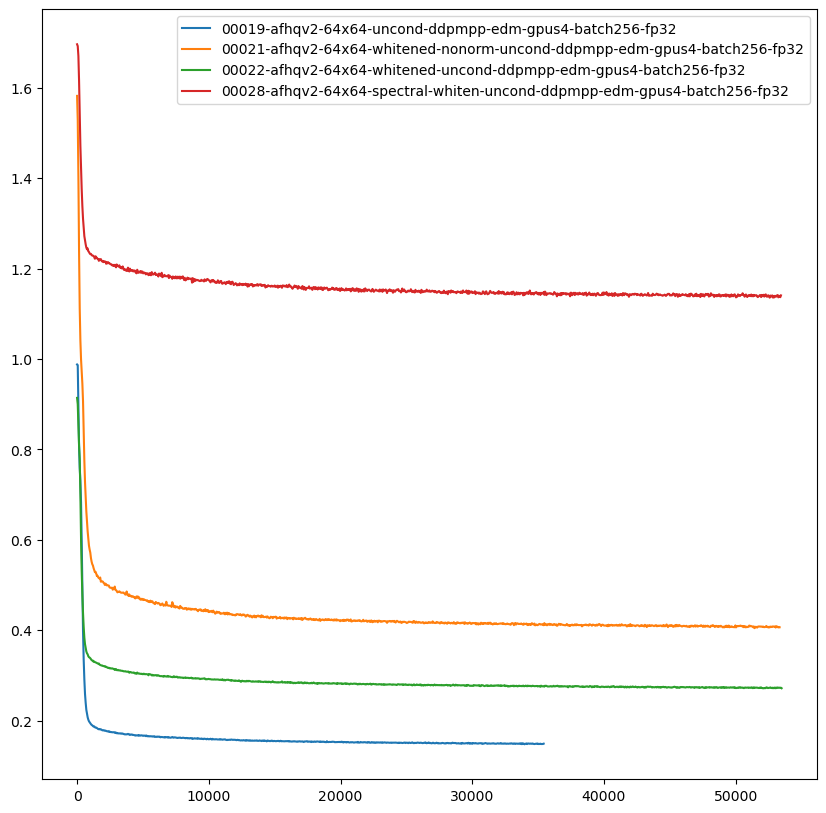

In [29]:
plt.figure(figsize=(10, 10))
for ckptdir in ['00019-afhqv2-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32',
#  '00020-ffhq-64x64-uncond-ddpmpp-edm-gpus4-batch256-fp32',
 '00021-afhqv2-64x64-whitened-nonorm-uncond-ddpmpp-edm-gpus4-batch256-fp32',
 '00022-afhqv2-64x64-whitened-uncond-ddpmpp-edm-gpus4-batch256-fp32',
#  '00023-ffhq-64x64-whitened-uncond-ddpmpp-edm-gpus4-batch256-fp32',
#  '00024-ffhq-64x64-whitened-nonorm-uncond-ddpmpp-edm-gpus4-batch256-fp32',
 '00028-afhqv2-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32',
#  '00029-ffhq-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32'
  ]:
   train_stats = load_stats(ckptdir)
   kimg_vec = train_stats["Progress/kimg"].map(lambda x: x["mean"])
   loss_traj = train_stats["Loss/loss"].map(lambda x: x["mean"])
   plt.plot(kimg_vec, loss_traj, label=ckptdir)
plt.legend()
plt.ylabel("Loss")
plt.xlabel("Progress Kimg")
plt.show()

1066it [00:00, 12543.32it/s]


<Axes: >

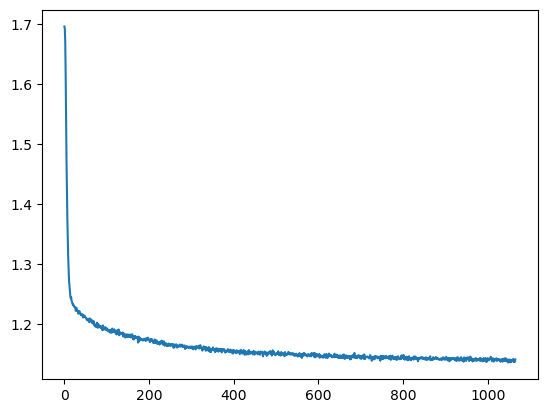

In [24]:
ckptdir = "00028-afhqv2-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32"
train_stats = load_stats(ckptdir)
train_stats["Loss/loss"].map(lambda x: x["mean"]).plot()

### Spectral Whiten Utils

In [ ]:
dataroot = "/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/datasets"

In [ ]:
!ls /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/datasets

afhqv2-64x64-eigen.pt		  ffhq-64x64-eigen.pt
afhqv2-64x64-spectral-whiten.pt   ffhq-64x64-spectral-whiten.pt
afhqv2-64x64-whitened-nonorm.zip  ffhq-64x64-whitened-nonorm.zip
afhqv2-64x64-whitened.zip	  ffhq-64x64-whitened.zip
afhqv2-64x64.zip		  ffhq-64x64.zip


In [ ]:
eigendata = torch.load(join(dataroot, "afhqv2-64x64-eigen.pt"))
eigvals = eigendata['eigvals']
eigvecs = eigendata['eigvecs']
image_mean = eigendata['image_mean']

In [ ]:
eigvals.shape, eigvecs.shape, image_mean.shape

(torch.Size([12288]), torch.Size([12288, 12288]), torch.Size([1, 12288]))

In [ ]:
def whiten_transform(image_tsr, eigvals, eigvecs, EPS=1E-5):
    image_mat = image_tsr.view(image_tsr.shape[0], -1)
    image_mean = image_mat.mean(dim=(0,), keepdim=True)
    image_mat_whiten = ((image_mat - image_mean) @ eigvecs) * (EPS + eigvals)**(-0.5) @ eigvecs.T
    image_tsr_whiten = image_mat_whiten.view(image_tsr.shape)
    return image_tsr_whiten

def unwhiten_transform(image_tsr, image_mean, eigvals, eigvecs, EPS=1E-5):
    image_mat_whiten = image_tsr.view(image_tsr.shape[0], -1)
    image_mat = ((image_mat_whiten @ eigvecs) * (EPS + eigvals)**(0.5)) @ eigvecs.T + image_mean
    image_tsr = image_mat.view(image_tsr.shape)
    return image_tsr


### EDM model on Spectral Whiten data

In [ ]:
import re 
# 00028-afhqv2-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32
ckptdir = "00029-ffhq-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32"
ckptdir = "00028-afhqv2-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32"
net = load_edm_model(ckptdir, ckpt_idx=-1,)

Loading  /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00028-afhqv2-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-002509.pkl
Epoch  2509


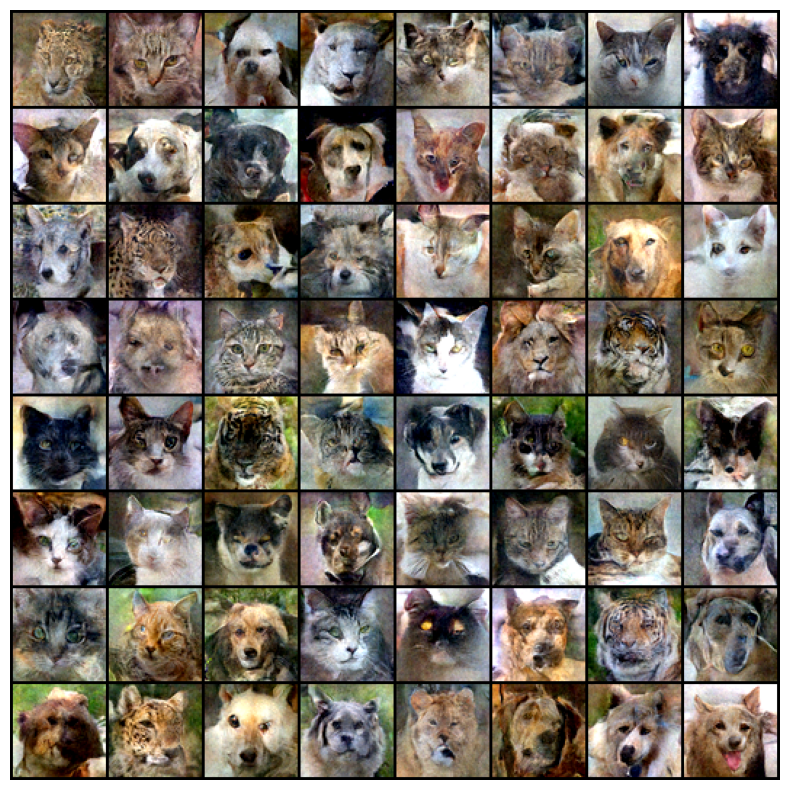

In [74]:
# Create a grid of images
batch_size = 64
latents = torch.randn([batch_size, net.img_channels, net.img_resolution, net.img_resolution], 
                    device=device, generator=torch.cuda.manual_seed(42))
samples = edm_sampler(net, latents, num_steps=35, )
samples_unwhiten = unwhiten_transform(samples.float(), image_mean, eigvals, eigvecs, EPS=1E-4)
samples_unwhiten.clamp_(0, 1)
grid = make_grid(samples_unwhiten.cpu(), nrow=8, normalize=True)
# Plot the grid
plt.figure(figsize=(10, 10))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')
plt.show()

In [ ]:
samples_unwhiten.mean(), samples_unwhiten.std(), samples_unwhiten.min(), samples_unwhiten.max()

(tensor(0.4335, device='cuda:0'),
 tensor(0.2302, device='cuda:0'),
 tensor(-0.2641, device='cuda:0'),
 tensor(1.3081, device='cuda:0'))

In [68]:
ckptdir = "00028-afhqv2-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32"
net = load_edm_model(ckptdir, ckpt_idx=1,)

Loading  /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00028-afhqv2-64x64-spectral-whiten-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-002509.pkl
Epoch  2509


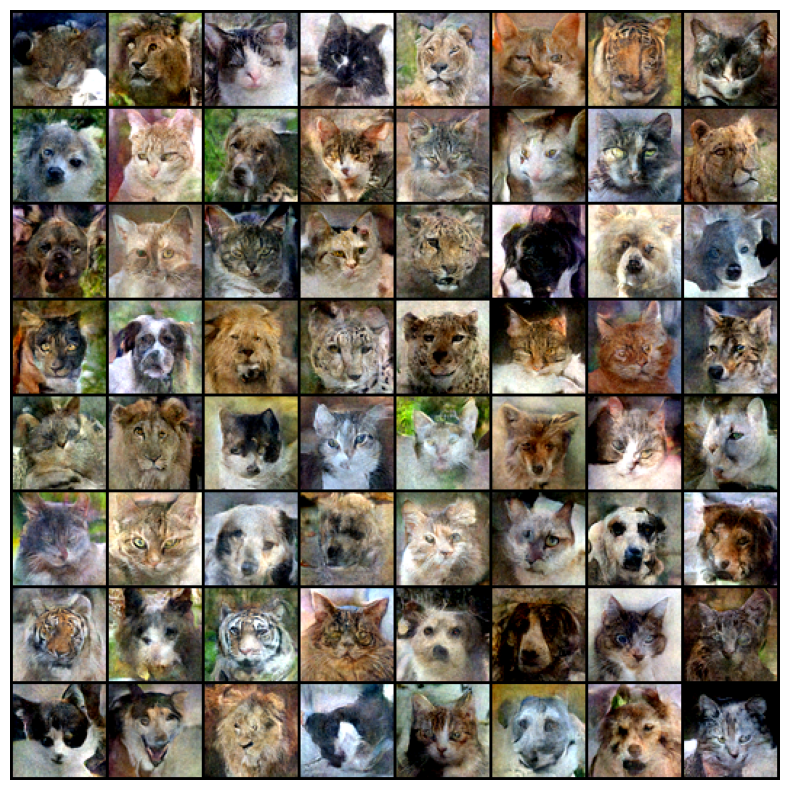

In [69]:
# Create a grid of images
batch_size = 64
latents = torch.randn([batch_size, net.img_channels, net.img_resolution, net.img_resolution], 
                    device=device)
samples = edm_sampler(net, latents, num_steps=35, )
samples_unwhiten = unwhiten_transform(samples.float(), image_mean, eigvals, eigvecs, EPS=1E-4)
samples_unwhiten.clamp_(0, 1)
grid = make_grid(samples_unwhiten.cpu(), nrow=8, normalize=True)
# Plot the grid
plt.figure(figsize=(10, 10))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')
plt.show()

In [58]:
samples_unwhiten.mean(), samples_unwhiten.std(), samples_unwhiten.min(), samples_unwhiten.max()

(tensor(0.4335, device='cuda:0'),
 tensor(0.2302, device='cuda:0'),
 tensor(-0.2641, device='cuda:0'),
 tensor(1.3081, device='cuda:0'))

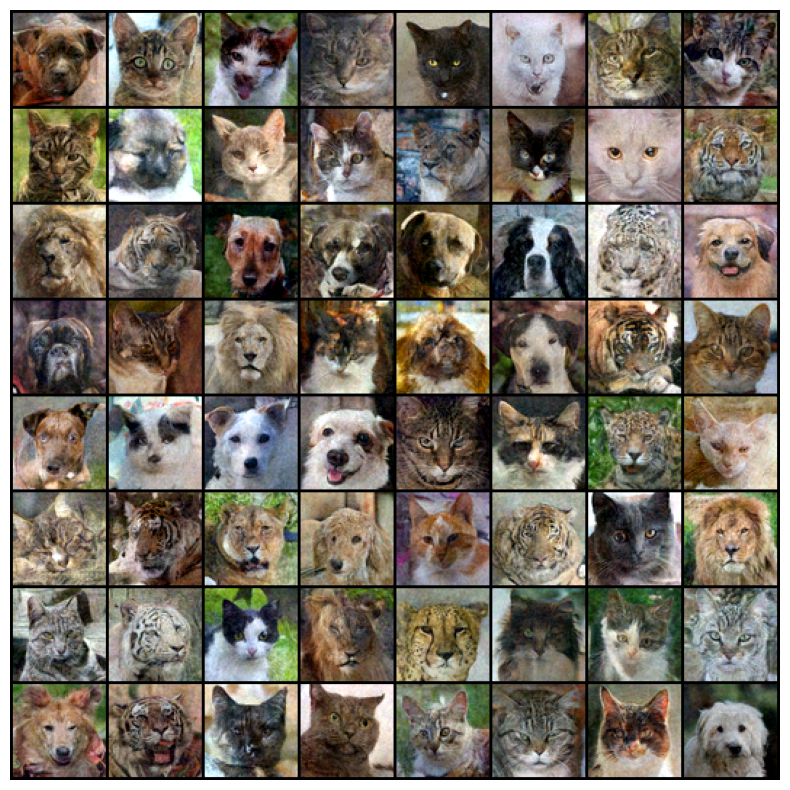

In [59]:
samples_unwhiten = unwhiten_transform(samples.float(), image_mean, eigvals, eigvecs)
samples_unwhiten.clamp_(0, 1)
grid = make_grid(samples_unwhiten.cpu(), nrow=8, normalize=True)
# Plot the grid
plt.figure(figsize=(10, 10))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')
plt.show()

### Spatial Fourier Whiten Dataset 

In [85]:
ckptdir = "00022-afhqv2-64x64-whitened-uncond-ddpmpp-edm-gpus4-batch256-fp32"
net = load_edm_model(ckptdir, ckpt_idx=-1,)

Loading -1th ckpt /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Github/edm/training-runs/00022-afhqv2-64x64-whitened-uncond-ddpmpp-edm-gpus4-batch256-fp32/network-snapshot-052685.pkl
Epoch  52685


In [ ]:
def whiten_image_process(image):
    return (np.clip(
        whiten_image(image.astype(np.float32).transpose(2, 0, 1) / 255.0,
                     mean=0.45477897, std=0.29),
                    0, 1) * 255.0
            ).astype(np.uint8).transpose(1, 2, 0)
    


In [88]:
from dataset_whiten_transform import get_mask, whiten_image, inverse_whitening

mask = get_mask(npix=64, coeff=0.75, r0=48)
samples_inv_whiten = []
for sample in samples.cpu().numpy():
    sample_inv_whiten = inverse_whitening(sample, mask, mean=0.45477897, std=0.29)
    samples_inv_whiten.append(sample_inv_whiten)
samples_inv_whiten = np.stack(samples_inv_whiten, axis=0)

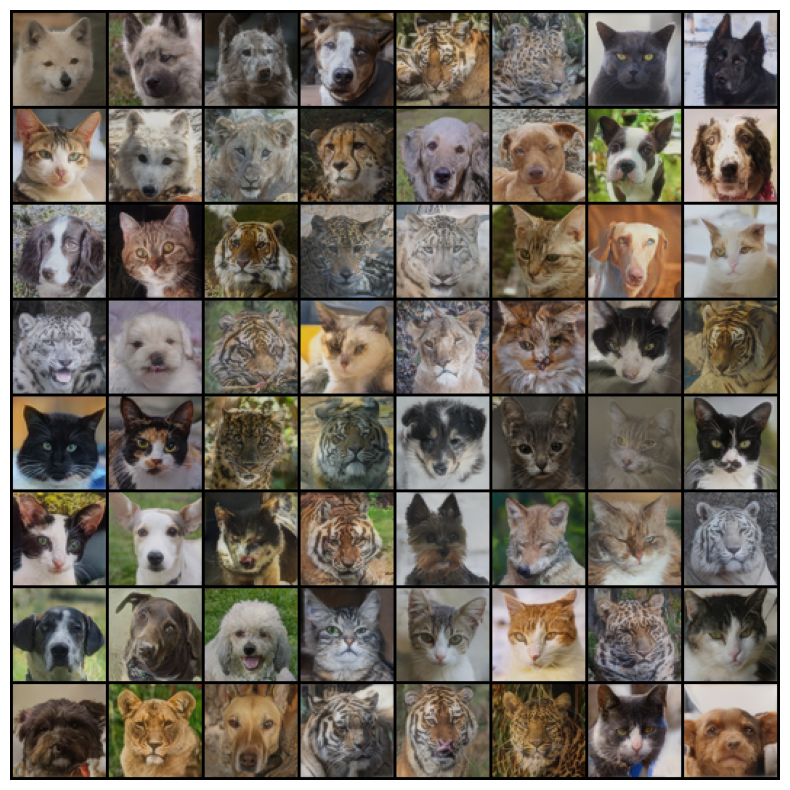

In [90]:
grid = make_grid(torch.from_numpy(samples_inv_whiten), nrow=8, normalize=True)
# Plot the grid
plt.figure(figsize=(10, 10))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')
plt.show()

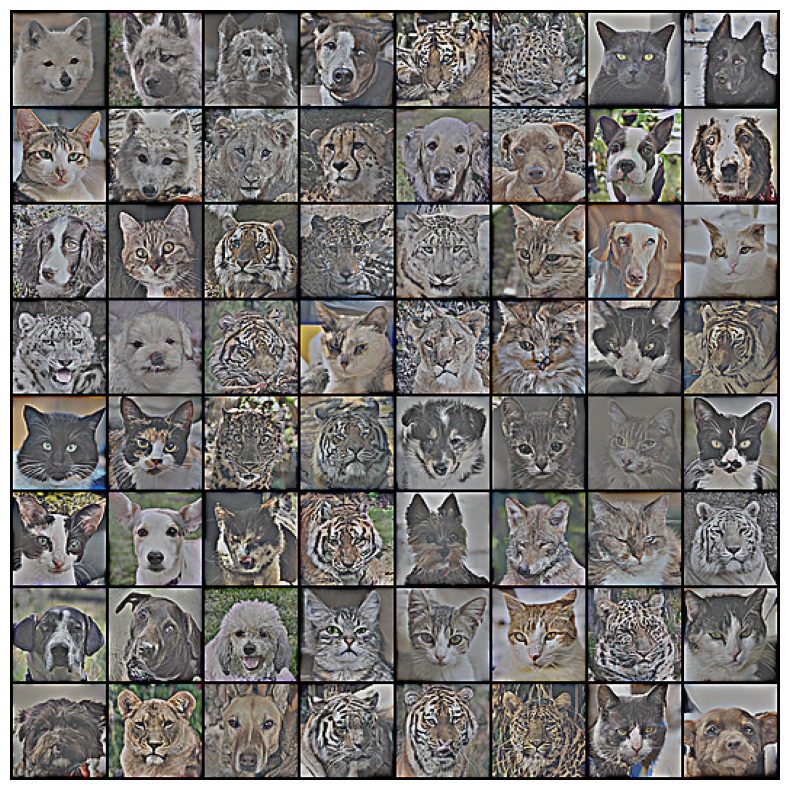

In [86]:
# Create a grid of images
batch_size = 64
latents = torch.randn([batch_size, net.img_channels, net.img_resolution, net.img_resolution], 
                    device=device, generator=torch.cuda.manual_seed(42))
samples = edm_sampler(net, latents, num_steps=35, )
# samples_unwhiten = unwhiten_transform(samples.float(), image_mean, eigvals, eigvecs, EPS=1E-4)
# samples_unwhiten.clamp_(0, 1)
grid = make_grid(samples.cpu(), nrow=8, normalize=True)
# Plot the grid
plt.figure(figsize=(10, 10))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')
plt.show()